# Datenexploration der Gasverbrauch- und Umweltdaten

In [1]:
import polars as pl

In [2]:
df_orig = df = pl.read_csv("../data/processed/consumption-cleaned-merged-weather.csv")
df

,GSM_ID,TP,Tag,ArrivalTime,Val,GYear,GMonth,GDay,GHour,Title,Unit,Type,s,m,CircuitType,CircuitNum,CircuitPoint,co2koeffizient,Objekttitel,adresse,plz,ort,qmbehfl,anzlwhg,diff,dayofweek,weekend,season,Temp_min,Temp_max,Temp_avg,Humidity_min,Humidity_max,Humidity_avg
i64,i64,str,str,str,f64,i64,i64,i64,i64,str,str,i64,i64,f64,str,i64,str,f64,str,str,i64,str,i64,i64,f64,i64,i64,str,f64,f64,f64,i64,i64,f64
0,400259,"""PulseCount0""","""VG""","""2018-01-31""",177392.0,2018,1,31,23,"""Gaszähler Kessel""","""CBM""",10,0,1.0,"""K""",0,"""GAS""",2.3,"""Gaszähler Kessel""","""Dorfstraße 122""",22889,"""Tangstedt""",1067,18,null,2,0,"""Winter""",2.0,9.0,4.9,100,93,87.1
1,400259,"""PulseCount0""","""VG""","""2018-02-01""",177452.5,2018,2,1,23,"""Gaszähler Kessel""","""CBM""",10,0,1.0,"""K""",0,"""GAS""",2.3,"""Gaszähler Kessel""","""Dorfstraße 122""",22889,"""Tangstedt""",1067,18,60.5,3,0,"""Winter""",1.0,4.0,2.5,75,93,83.6
2,400259,"""PulseCount0""","""VG""","""2018-02-02""",177510.6,2018,2,2,23,"""Gaszähler Kessel""","""CBM""",10,0,1.0,"""K""",0,"""GAS""",2.3,"""Gaszähler Kessel""","""Dorfstraße 122""",22889,"""Tangstedt""",1067,18,58.1,4,0,"""Winter""",2.0,4.0,3.1,81,93,88.8
3,400259,"""PulseCount0""","""VG""","""2018-02-03""",177577.0,2018,2,3,23,"""Gaszähler Kessel""","""CBM""",10,0,1.0,"""K""",0,"""GAS""",2.3,"""Gaszähler Kessel""","""Dorfstraße 122""",22889,"""Tangstedt""",1067,18,66.4,5,1,"""Winter""",-1.0,2.0,-0.4,100,93,88.2
4,400259,"""PulseCount0""","""VG""","""2018-02-04""",177651.0,2018,2,4,23,"""Gaszähler Kessel""","""CBM""",10,0,1.0,"""K""",0,"""GAS""",2.3,"""Gaszähler Kessel""","""Dorfstraße 122""",22889,"""Tangstedt""",1067,18,74.0,6,1,"""Winter""",-2.0,1.0,-0.1,86,93,91.5
…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…
405035,400732,"""Gas""","""VG""","""2022-03-12""",376352.5,2022,3,12,23,"""Gaszähler Kessel""","""CBM""",10,0,1.0,"""NN""",0,"""NN""",2.3,"""Gaszähler Kessel""","""Nordalbingerweg 1-9,Vielohweg …",22455,"""Hamburg""",9888,153,61.9,5,1,"""Winter""",0.6,11.9,5.8,28,46,36.5
405036,400732,"""Gas""","""VG""","""2022-03-13""",376410.9,2022,3,13,23,"""Gaszähler Kessel""","""CBM""",10,0,1.0,"""NN""",0,"""NN""",2.3,"""Gaszähler Kessel""","""Nordalbingerweg 1-9,Vielohweg …",22455,"""Hamburg""",9888,153,58.4,6,1,"""Winter""",0.4,12.2,6.3,26,52,38.4
405037,400732,"""Gas""","""VG""","""2022-03-14""",376467.4,2022,3,14,23,"""Gaszähler Kessel""","""CBM""",10,0,1.0,"""NN""",0,"""NN""",2.3,"""Gaszähler Kessel""","""Nordalbingerweg 1-9,Vielohweg …",22455,"""Hamburg""",9888,153,56.5,0,0,"""Winter""",2.2,10.0,6.5,40,96,67.0


Erstellen einer neuen ID, aus der Kombination von GSM_ID, TP und Tag

In [3]:
df = df.with_columns(pl.when(
    pl.col("TP") == "Gas",
    pl.col("Tag") == "VG"
).then(
    pl.col("GSM_ID").cast(pl.String).add("GVG")
).when(
    pl.col("TP") == "Gas",
    pl.col("Tag") == "VA"
).then(
    pl.col("GSM_ID").cast(pl.String).add("GVA")
).alias("new_id")).filter(
    pl.col("TP") == "Gas"  # only examples with TP="Gas" are relevant
)

In [4]:
# df = df.with_columns(pl.datetime(pl.col("GYear"), pl.col("GMonth"), pl.col("GDay")).alias("date"))  # add date column
df_added_cols = df = df.with_columns(
    pl.col("ArrivalTime").str.to_date(format='%Y-%m-%d').alias('date'))  # add date column

Passe die Werte für "Schenfelder Holt 135" an (entferne die BHKW Werte von Gaszähle Gesamt)

In [5]:
df.filter(pl.col("adresse") == "Schenfelder Holt 135").plot.line(x="date", y="diff", color="Title")

alt.Chart(...)

In [6]:
df_gesamt = df.filter(pl.col("new_id") == "400768GVG")
df_gesamt = df_gesamt.with_columns((df.filter(pl.col("new_id") == "400768GVA")["diff"]).alias("bhkw"))
df_gesamt = df_gesamt.with_columns((df_gesamt["diff"] - df_gesamt["bhkw"]).alias("wo_bhkw"))

df_gesamt.select(["diff", "bhkw", "wo_bhkw"])

diff,bhkw,wo_bhkw
f64,f64,f64
null,null,null
1233.0,460.9,772.1
1365.2,399.2,966.0
4294.2,1248.9,3045.3
1245.3,357.0,888.3
…,…,…
3631.4,561.1,3070.3
3587.8,406.6,3181.2
3253.0,497.5,2755.5


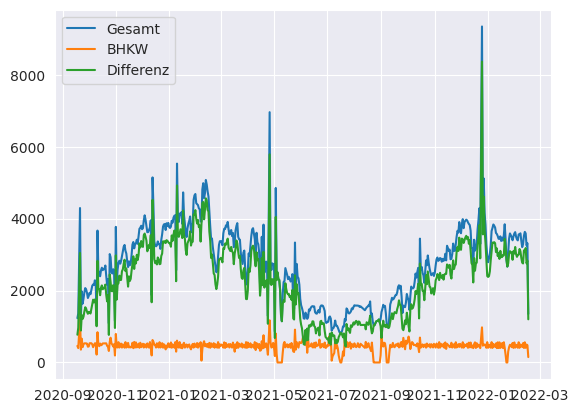

In [7]:
import matplotlib.pyplot as plt

plt.plot(df_gesamt["date"], df_gesamt["diff"], label="Gesamt")
plt.plot(df_gesamt["date"], df_gesamt["bhkw"], label="BHKW")
plt.plot(df_gesamt["date"], df_gesamt["wo_bhkw"], label="Differenz")

plt.legend()
plt.show()

Update die Werte für Schenfelder Holt 135, nehme die Differenz anstatt des Gesamtverbrauchs

In [8]:
df_no_bhkw = df.filter(pl.col("new_id") == "400768GVG").replace_column(df.get_column_index("diff"), df_gesamt["wo_bhkw"].alias("diff")
                                        ).replace_column(df.get_column_index("Title"), pl.Series("Title", ["Gaszähler" for x in range(len(df.filter(pl.col("new_id") == "400768GVG")))]))

# drop rows with sum of gas and bhkw
df = df.filter(~(pl.col("new_id") == "400768GVG"))

# add difference to DataFrame
df = pl.concat([df, df_no_bhkw])
df.filter(pl.col("new_id") == "400768GVG").select("Title", "diff", "adresse")

Title,diff,adresse
str,f64,str
"""Gaszähler""",null,"""Schenfelder Holt 135"""
"""Gaszähler""",772.1,"""Schenfelder Holt 135"""
"""Gaszähler""",966.0,"""Schenfelder Holt 135"""
"""Gaszähler""",3045.3,"""Schenfelder Holt 135"""
"""Gaszähler""",888.3,"""Schenfelder Holt 135"""
…,…,…
"""Gaszähler""",3070.3,"""Schenfelder Holt 135"""
"""Gaszähler""",3181.2,"""Schenfelder Holt 135"""
"""Gaszähler""",2755.5,"""Schenfelder Holt 135"""


Entferne BHKWs und GAPWs

In [9]:
df = df.filter(~(pl.col("Title") == "Gaszähler BHKW"))
df = df.filter(~(pl.col("Title") == "Gaszähler GAWP"))

len(df)

30876

### Titel Vereinheitlichen
Vereinheitliche den Namen der Gaszähler. Viele verschieden Namen für die gleiche Bedeutung

In [10]:
df["Title"].unique()

Title
str
"""Gas"""
"""Gas Zähler"""
"""Gaszähler Kessel Z"""
"""Gaszähler Kessel"""
"""Gaszähler Z Kessel"""
"""Gaszähler"""
"""Gesamt Gaszähler"""
"""Gaszähler Turnhalle"""


In [11]:
df = df.with_columns(pl.when(pl.col("Title") == "Gas Zähler").then(pl.lit("Gaszähler")).otherwise("Title").alias("Title"))
df = df.with_columns(pl.when(pl.col("Title") == "Gaszähler Z Kessel").then(pl.lit("Gaszähler Kessel Z")).otherwise("Title").alias("Title"))
df = df.with_columns(pl.when(pl.col("Title") == "Gas").then(pl.lit("Gaszähler")).otherwise("Title").alias("Title"))
df = df.with_columns(pl.when(pl.col("Title") == "Gesamt Gaszähler").then(pl.lit("Gaszähler Gesamt")).otherwise("Title").alias("Title"))
df["Title"].unique()

Title
str
"""Gaszähler Kessel Z"""
"""Gaszähler Turnhalle"""
"""Gaszähler"""
"""Gaszähler Gesamt"""
"""Gaszähler Kessel"""


In [12]:
df.group_by(pl.col("Title")).agg(pl.col("new_id").unique().count())

Title,new_id
str,u32
"""Gaszähler Turnhalle""",1
"""Gaszähler Kessel Z""",2
"""Gaszähler Kessel""",8
"""Gaszähler Gesamt""",1
"""Gaszähler""",35


Entferne falsche Werte für Gaszähler Wilhelmstraße 33-41, da dieser beim Wechsel des Zählers unsinnige Werte gesendet hat

In [13]:
df.filter(pl.col("new_id") == "400305GVG").plot.line(x="date", y="Val")

alt.Chart(...)

Entferne den Zeitraum 2019-11-06 bis 2019-12-21

In [14]:
from datetime import datetime

df = df.filter(~((pl.col("new_id") == "400305GVG") & (pl.col("date").is_between(datetime(2019, 11, 6), datetime(2019, 12, 21)))))  # remove corrupt days

df.filter(pl.col("new_id") == "400305GVG").plot.line(x="date", y="Val")

alt.Chart(...)

Wie viele Werte pro Gaszähler gibt es?

In [15]:
df.group_by("new_id").agg(
    pl.len()
)

new_id,len
str,u32
"""400087GVG""",1230
"""400451GVG""",567
"""400917GVG""",291
"""400305GVG""",1107
"""400704GVG""",562
…,…
"""400969GVG""",167
"""400965GVG""",217
"""400131GVG""",1061


In [16]:
df.group_by("new_id").agg(
    pl.len()
).plot.bar(x="new_id", y="len")

alt.Chart(...)

Wie lang ist der Zeitraum pro Gaszähler?

In [17]:
df.group_by("new_id").agg(
    [pl.col("date").min().alias("min_date"),
     pl.col("date").max().alias("max_date")
     ]
)

new_id,min_date,max_date
str,date,date
"""400915GVG""",2021-05-28,2022-03-16
"""400965GVG""",2021-08-25,2022-03-30
"""400444GVG""",2020-03-17,2022-03-16
"""400296GVG""",2019-03-26,2022-03-16
"""400306GVG""",2020-03-12,2022-03-16
…,…,…
"""400698GVG""",2020-06-24,2022-03-16
"""400768GVG""",2020-09-17,2022-02-16
"""400100GVG""",2018-08-07,2022-03-23


Erstelle für jeden Gaszähler ein Diagramm, welches den Gasverbrauch pro Zeit darstellt

In [18]:
import pandas as pd
import plotly.graph_objs as go

df_min_max_dates = df.group_by(["new_id"]).agg(
    [pl.col("date").min().alias("min_date"),
     pl.col("date").max().alias("max_date"),
     pl.len().alias("days")
     ]
)

fig = go.Figure()
for (start, end, value, days) in zip(df_min_max_dates["min_date"], df_min_max_dates["max_date"],
                                     df_min_max_dates["new_id"], df_min_max_dates["days"]):
    # name = f"{start} to {end}"
    name = days
    fig.add_trace(go.Scatter(x=[start, end], y=[value, value],
                             mode='lines', name=name))

fig.show()
# fig.write_html("../reports/figures/gaszähler_start_end_datum.html")
fig.write_image("../reports/figures/gaszähler_start_end_datum.png")

In [19]:


import polars as pl
import pandas as pd
import plotly.express as px

# Berechne den Prozentsatz der Werte vor jedem Datum
df_sorted = df.sort("date")
df_sorted = df_sorted.with_columns(
    (pl.arange(0, df_sorted.height) / df_sorted.height * 100).alias("percentage")
)

# Konvertiere das DataFrame zu Pandas für die Plot-Erstellung
df_pandas = df_sorted.to_pandas()

# Erstelle den interaktiven Plot
fig = px.line(df_pandas, x="date", y="percentage", title="Percentage of Values Before Each Date", labels={"percentage": "Percentage", "date": "Date"})
fig.show()

Wie viele Gaszähler gibt es?

In [20]:
ids = [id[0] for id in df.select(pl.col("new_id").unique()).iter_rows()]  # get list of unique ids
len(ids)

47

## Datenreinigung

Um Datenfehler zu erkennen, füge den Verbrauch pro Tag hinzu und filtere alle Daten, bei denen dieser Wert negativ wird

In [21]:
corrupted = []
not_corrupted = []

for id in ids:
    min_value = df.filter(
        pl.col("new_id") == id
    ).select(
        pl.col("diff")
    ).min().item()  # get min value of the change value of the gas meter for this ID

    if min_value < 0:  # gas meter data corrupted
        corrupted.append(id)
    else:
        not_corrupted.append(id)

print(f"Corrupted: {len(corrupted)}")
print(f"Not Corrupted: {len(not_corrupted)}")
corrupted

Corrupted: 6
Not Corrupted: 41


['400204GVA', '400818GVG', '400455GVG', '400697GVG', '400711GVG', '400698GVG']

In [22]:
def plot_gas_meter_per_day(df, id):
    plot = df.filter(
        pl.col("new_id").eq(id)
    ).select(
        pl.col("Val"),
        pl.col("date")
    ).plot.line(x="date", y="Val")
    return plot


id = ("400768GVG")
plot_gas_meter_per_day(df, id)

alt.Chart(...)

Speichere Gaszählerstand/Zeit Plots für alle Gaszähler 

In [23]:
import os

path = "../reports/figures/verbrauch_pro_zeit"
path_corrupted = f"{path}/corrupted"
path_not_corrupted = f"{path}/not_corrupted"

if not os.path.exists(path):  # only store plots if folder doesnt exist yet
    os.makedirs(path)
    os.makedirs(path_corrupted)
    for id in corrupted:
        plot = plot_gas_meter_per_day(df, id)
        plot.save(f"{path_corrupted}/{id}.png")  # store plot
        print(f"Saved {id}.png to {path_corrupted}")

    os.makedirs(path_not_corrupted)
    for id in not_corrupted:
        plot = plot_gas_meter_per_day(df, id)
        plot.save(f"{path_not_corrupted}/{id}.png")  # store plot
        print(f"Saved {id}.png to {path_not_corrupted}")


Behandle fehlerhaften Aufzeichnungen

In [24]:
dfs = []

for id in corrupted:  # only look at not corrupted gas meter data
    id_df = df.filter(
        pl.col("new_id") == id  # look at one gas meter at a time
    )
    
    dfs.append(id_df)

df_corrupted = pl.concat(dfs)  # add diff column to df_corrupted

In [25]:
df_corrupted.filter(pl.col("diff") < 0).group_by(
    pl.col("new_id")).agg(
    pl.len())  # number of diff values that are below zero

new_id,len
str,u32
"""400711GVG""",1
"""400818GVG""",1
"""400698GVG""",1
"""400697GVG""",1
"""400455GVG""",1
"""400204GVA""",1


In [26]:
path = "../reports/figures/verbrauch_pro_zeit"
path_corrupted = f"{path}/corrupted"

for id in corrupted:
    plot = df_corrupted.filter(
        pl.col("new_id").eq(id)
    ).select(
        pl.col("Val"),
        pl.col("date")
    ).plot.scatter(x="date", y="Val")

    plot.save(f"{path_corrupted}/{id}_scatter.png")  # store plot
    print(f"Saved {id}_scatter.png to {path_corrupted}")

Saved 400204GVA_scatter.png to ../reports/figures/verbrauch_pro_zeit/corrupted
Saved 400818GVG_scatter.png to ../reports/figures/verbrauch_pro_zeit/corrupted
Saved 400455GVG_scatter.png to ../reports/figures/verbrauch_pro_zeit/corrupted
Saved 400697GVG_scatter.png to ../reports/figures/verbrauch_pro_zeit/corrupted
Saved 400711GVG_scatter.png to ../reports/figures/verbrauch_pro_zeit/corrupted
Saved 400698GVG_scatter.png to ../reports/figures/verbrauch_pro_zeit/corrupted


In [27]:
df_cleaned = df_corrupted.filter(
    pl.col("diff") >= 0  # remove all rows with negative usage
)
df_cleaned

,GSM_ID,TP,Tag,ArrivalTime,Val,GYear,GMonth,GDay,GHour,Title,Unit,Type,s,m,CircuitType,CircuitNum,CircuitPoint,co2koeffizient,Objekttitel,adresse,plz,ort,qmbehfl,anzlwhg,diff,dayofweek,weekend,season,Temp_min,Temp_max,Temp_avg,Humidity_min,Humidity_max,Humidity_avg,new_id,date
i64,i64,str,str,str,f64,i64,i64,i64,i64,str,str,i64,i64,f64,str,i64,str,f64,str,str,i64,str,i64,i64,f64,i64,i64,str,f64,f64,f64,i64,i64,f64,str,date
353054,400204,"""Gas""","""VA""","""2019-06-15""",4.8764e7,2019,6,15,23,"""Gaszähler""","""CBM""",10,0,1.0,"""NN""",0,"""NN""",2.3,"""Gaszähler""","""Kaltenbergen 22""",22117,"""Hamburg""",39720,568,661.9,5,1,"""Spring""",14.3,21.0,18.0,64,93,81.7,"""400204GVA""",2019-06-15
353055,400204,"""Gas""","""VA""","""2019-06-16""",4.8765e7,2019,6,16,23,"""Gaszähler""","""CBM""",10,0,1.0,"""NN""",0,"""NN""",2.3,"""Gaszähler""","""Kaltenbergen 22""",22117,"""Hamburg""",39720,568,684.5,6,1,"""Spring""",12.2,22.5,17.6,100,93,70.8,"""400204GVA""",2019-06-16
353056,400204,"""Gas""","""VA""","""2019-06-17""",4.8766e7,2019,6,17,23,"""Gaszähler""","""CBM""",10,0,1.0,"""NN""",0,"""NN""",2.3,"""Gaszähler""","""Kaltenbergen 22""",22117,"""Hamburg""",39720,568,651.4,0,0,"""Spring""",12.1,25.3,19.8,100,93,64.4,"""400204GVA""",2019-06-17
353057,400204,"""Gas""","""VA""","""2019-06-18""",4.8766e7,2019,6,18,23,"""Gaszähler""","""CBM""",10,0,1.0,"""NN""",0,"""NN""",2.3,"""Gaszähler""","""Kaltenbergen 22""",22117,"""Hamburg""",39720,568,618.2,1,0,"""Spring""",16.7,28.2,22.3,39,82,61.6,"""400204GVA""",2019-06-18
353058,400204,"""Gas""","""VA""","""2019-06-19""",4.8767e7,2019,6,19,23,"""Gaszähler""","""CBM""",10,0,1.0,"""NN""",0,"""NN""",2.3,"""Gaszähler""","""Kaltenbergen 22""",22117,"""Hamburg""",39720,568,587.7,2,0,"""Spring""",16.9,30.2,22.5,31,93,63.8,"""400204GVA""",2019-06-19
…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…
352904,400698,"""Gas""","""VG""","""2022-03-12""",593082.6,2022,3,12,23,"""Gaszähler Kessel Z""","""CBM""",10,0,1.0,"""NN""",0,"""NN""",2.3,"""Gaszähler Kessel Z""","""Ottensweide 13-20""",21109,"""Hamburg""",8905,117,283.0,5,1,"""Winter""",0.6,11.9,5.8,28,46,36.5,"""400698GVG""",2022-03-12
352905,400698,"""Gas""","""VG""","""2022-03-13""",593353.1,2022,3,13,23,"""Gaszähler Kessel Z""","""CBM""",10,0,1.0,"""NN""",0,"""NN""",2.3,"""Gaszähler Kessel Z""","""Ottensweide 13-20""",21109,"""Hamburg""",8905,117,270.5,6,1,"""Winter""",0.4,12.2,6.3,26,52,38.4,"""400698GVG""",2022-03-13
352906,400698,"""Gas""","""VG""","""2022-03-14""",593618.3,2022,3,14,23,"""Gaszähler Kessel Z""","""CBM""",10,0,1.0,"""NN""",0,"""NN""",2.3,"""Gaszähler Kessel Z""","""Ottensweide 13-20""",21109,"""Hamburg""",8905,117,265.2,0,0,"""Winter""",2.2,10.0,6.5,40,96,67.0,"""400698GVG""",2022-03-14


Füge alle DFs zusammen

In [28]:
dfs = []

for id in not_corrupted:  # only look at not corrupted gas meter data
    id_df = df.filter(
        pl.col("new_id") == id  # look at one gas meter at a time
    )
    dfs.append(id_df)

df_clean = pl.concat(dfs)  # all dfs with no initial error
df_clean_neg_vals = df = pl.concat([df_clean, df_cleaned])  # add cleaned examples

Überprüfe, dass es keine negative Verbrauchswerte mehr gibt

In [29]:
df.filter(
    pl.col("diff") < 0
).count()

,GSM_ID,TP,Tag,ArrivalTime,Val,GYear,GMonth,GDay,GHour,Title,Unit,Type,s,m,CircuitType,CircuitNum,CircuitPoint,co2koeffizient,Objekttitel,adresse,plz,ort,qmbehfl,anzlwhg,diff,dayofweek,weekend,season,Temp_min,Temp_max,Temp_avg,Humidity_min,Humidity_max,Humidity_avg,new_id,date
u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [30]:
len(df)

30818

## Statistische Kennwerte

Erhebe statistische Kennzahlen über den Verbrauch

In [31]:
df.group_by("new_id").agg(
    pl.col("diff").mean().alias("mean"),
    pl.col("diff").min().alias("min"),
    pl.col("diff").max().alias("max"),
    pl.col("diff").std().alias("std"),
    pl.col("diff").median().alias("median"),
)

new_id,mean,min,max,std,median
str,f64,f64,f64,f64,f64
"""400917GVG""",6.576207,0.8,37.0,5.291812,5.3
"""400961GVG""",54.684848,19.1,156.5,13.430792,54.8
"""400731GVG""",41.581488,8.8,175.6,25.040872,41.45
"""400969GVG""",149.962048,60.9,460.0,43.126746,155.4
"""400704GVG""",336.573797,0.0,3386.2,241.873994,353.3
…,…,…,…,…,…
"""400204GVA""",1820.406172,2.7,22680.0,1335.512703,1770.0
"""400732GVG""",82.434247,9.3,5532.0,372.072982,59.5
"""400306GVG""",77.976631,19.6,8413.7,326.961626,56.5


In [32]:
df.group_by("dayofweek").agg(
    pl.col("diff").mean().alias("mean"),
    pl.col("diff").min().alias("min"),
    pl.col("diff").max().alias("max"),
    pl.col("diff").std().alias("std"),
    pl.col("diff").median().alias("median"),
)

dayofweek,mean,min,max,std,median
i64,f64,f64,f64,f64,f64
3,231.247098,0.0,4254.6,482.987651,77.9
6,243.183095,0.0,5500.0,521.775933,80.3
0,264.51506,0.0,29583.0,771.170769,81.0
4,282.49762,0.0,173311.0,2675.72319,78.5
1,241.711986,0.0,14290.0,541.96042,79.1
2,235.670218,0.0,5532.0,501.78755,78.2
5,232.982189,0.0,8366.2,517.337194,77.9


In [33]:
df.group_by("Temp_avg").agg(
    pl.col("diff").mean().alias("mean"),
    pl.col("diff").min().alias("min"),
    pl.col("diff").max().alias("max"),
    pl.col("diff").std().alias("std"),
    pl.col("diff").median().alias("median"),
)

Temp_avg,mean,min,max,std,median
f64,f64,f64,f64,f64,f64
18.2,96.477848,0.0,1146.9,196.731621,33.15
17.4,80.17619,0.0,1269.0,180.118879,31.45
12.8,203.292045,11.0,2000.6,367.40466,70.8
5.1,439.898864,0.0,5786.4,818.219584,134.05
25.0,58.35,0.0,620.0,128.719165,20.8
…,…,…,…,…,…
22.9,60.694118,0.0,650.0,126.992207,20.75
-3.4,151.630769,0.0,423.8,119.503608,127.8
1.7,475.372093,0.0,3720.0,781.282276,161.5


## Plots

Plotte den Verbrauch in Relation zur Außentemperatur

In [34]:
import altair as alt

alt.data_transformers.enable("vegafusion")
path = "../reports/figures"

plt = df.filter(
    pl.col("diff") < 8000  # filter outliers TODO: find better method
).plot.scatter(x="diff", y="Temp_avg", color="season")

plt.save(f"{path}/avg_temp_usage_scatter.png")
plt

alt.Chart(...)

Die Temperatur bestimmt den Heizvorgang nicht maßgeblich. Es gibt einige Ausreißer, welche auch bei hohen Temperaturen mehr heizen, als manche bei niedrigen Temperaturen. Das legt nahe, dass noch andere Faktoren Einfluß auf den Verbrauch haben.

In [35]:
plt = df.filter(
    pl.col("diff") < 8000  # filter outliers TODO: find better method
).plot.scatter(x="diff", y="Temp_avg", color="dayofweek")

plt.save(f"{path}/avg_temp_usage_dayofweek_scatter.png")
plt

alt.Chart(...)

In [36]:
title = "Average Humidity per Usage"

chart = alt.Chart(df.filter(pl.col("diff") < 6000), title=title).mark_point().encode(
    x="diff",
    y=alt.Y("Humidity_avg").scale(zero=False),
    color="dayofweek",
    size="season"
)

chart.save(f"{path}/{title}.png")
chart

alt.Chart(...)

## Korrelationsmatrix

In [37]:
df.select(
    pl.col(pl.Int64),
    pl.col(pl.Float64)
).drop_nulls().corr()

/home/daniel/PycharmProjects/energy-forecast-prototype/venv/lib/python3.12/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning:

invalid value encountered in divide

/home/daniel/PycharmProjects/energy-forecast-prototype/venv/lib/python3.12/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning:

invalid value encountered in divide



column_0,GSM_ID,GYear,GMonth,GDay,GHour,Type,s,CircuitNum,plz,qmbehfl,anzlwhg,dayofweek,weekend,Humidity_min,Humidity_max,Val,m,co2koeffizient,diff,Temp_min,Temp_max,Temp_avg,Humidity_avg
f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64
1.0,0.216346,0.150787,0.015631,-0.004656,NaN,NaN,NaN,-0.228706,-0.074362,0.153126,0.125661,0.000023,0.000572,0.050869,0.038686,0.157101,NaN,0.061427,0.049779,-0.021714,-0.040059,-0.034024,0.068528
0.216346,1.0,0.38365,0.033742,-0.004209,NaN,NaN,NaN,-0.149187,0.155669,0.066444,0.050757,0.00145,0.003149,0.025475,0.107866,-0.019629,NaN,0.125197,0.033783,-0.011997,-0.050924,-0.039044,0.158386
0.150787,0.38365,1.0,-0.32853,-0.041015,NaN,NaN,NaN,0.048524,0.063497,0.059105,0.02906,0.002241,0.005924,-0.05124,0.079462,-0.075758,NaN,0.045344,0.039404,-0.183502,-0.210905,-0.213197,0.174449
0.015631,0.033742,-0.32853,1.0,0.025208,NaN,NaN,NaN,-0.009875,0.007981,0.007236,0.010154,-0.00929,-0.010204,0.159592,0.18126,0.002856,NaN,-0.001039,-0.017842,0.280074,0.165658,0.223329,0.222912
-0.004656,-0.004209,-0.041015,0.025208,1.0,NaN,NaN,NaN,-0.00104,0.00324,-0.000094,-0.000353,0.003112,0.008271,-0.007729,0.002152,0.00311,NaN,0.00238,-0.007988,0.047129,0.05784,0.052022,-0.042519
…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…
0.049779,0.033783,0.039404,-0.017842,-0.007988,NaN,NaN,NaN,-0.005764,-0.02278,0.358494,0.355217,-0.00219,-0.005188,0.058491,0.025521,0.186157,NaN,0.022693,1.0,-0.094408,-0.103403,-0.102722,0.060171
-0.021714,-0.011997,-0.183502,0.280074,0.047129,NaN,NaN,NaN,-0.005997,0.062569,-0.001029,0.003787,0.00782,-0.007418,-0.18732,-0.030199,0.000656,NaN,0.024841,-0.094408,1.0,0.871319,0.952247,-0.173155
-0.040059,-0.050924,-0.210905,0.165658,0.05784,NaN,NaN,NaN,0.007237,0.068436,-0.013421,-0.00654,0.006506,0.002655,-0.354076,-0.161976,-0.00084,NaN,0.03025,-0.103403,0.871319,1.0,0.973385,-0.474293


In [38]:
df.select(
    pl.col(pl.Int64),
    pl.col(pl.Float64)
).drop_nulls().to_pandas().corr()

,,GSM_ID,GYear,GMonth,GDay,GHour,Type,s,CircuitNum,plz,...,Humidity_min,Humidity_max,Val,m,co2koeffizient,diff,Temp_min,Temp_max,Temp_avg,Humidity_avg
,1.000000,0.216346,0.150787,0.015631,-0.004656,NaN,NaN,NaN,-0.228706,-0.074362,...,0.050869,0.038686,0.157101,NaN,0.061427,0.049779,-0.021714,-0.040059,-0.034024,0.068528
GSM_ID,0.216346,1.000000,0.383650,0.033742,-0.004209,NaN,NaN,NaN,-0.149187,0.155669,...,0.025475,0.107866,-0.019629,NaN,0.125197,0.033783,-0.011997,-0.050924,-0.039044,0.158386
GYear,0.150787,0.383650,1.000000,-0.328530,-0.041015,NaN,NaN,NaN,0.048524,0.063497,...,-0.051240,0.079462,-0.075758,NaN,0.045344,0.039404,-0.183502,-0.210905,-0.213197,0.174449
GMonth,0.015631,0.033742,-0.328530,1.000000,0.025208,NaN,NaN,NaN,-0.009875,0.007981,...,0.159592,0.181260,0.002856,NaN,-0.001039,-0.017842,0.280074,0.165658,0.223329,0.222912
GDay,-0.004656,-0.004209,-0.041015,0.025208,1.000000,NaN,NaN,NaN,-0.001040,0.003240,...,-0.007729,0.002152,0.003110,NaN,0.002380,-0.007988,0.047129,0.057840,0.052022,-0.042519
GHour,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Type,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
s,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
CircuitNum,-0.228706,-0.149187,0.048524,-0.009875,-0.001040,NaN,NaN,NaN,1.000000,0.086610,...,-0.037720,-0.016813,-0.021559,NaN,0.023836,-0.005764,-0.005997,0.007237,0.000121,-0.001958
plz,-0.074362,0.155669,0.063497,0.007981,0.003240,NaN,NaN,NaN,0.086610,1.000000,...,-0.041861,-0.001247,-0.025440,NaN,0.023852,-0.022780,0.062569,0.068436,0.066947,0.008013


## Outlier

Gruppiere die Anlagen nach durchschnittlicher Nutzung

In [39]:
df.group_by(["new_id", "adresse", "plz", "ort", "Objekttitel", "qmbehfl", "anzlwhg"]).agg(
    pl.col("diff").mean().alias("diff_mean"),
    pl.col("diff").max().alias("diff_max"),
).sort(["diff_mean", "diff_max"], descending=True)

new_id,adresse,plz,ort,Objekttitel,qmbehfl,anzlwhg,diff_mean,diff_max
str,str,i64,str,str,i64,i64,f64,f64
"""400768GVG""","""Schenfelder Holt 135""",22589,"""Hamburg""","""Gaszähler Gesamt""",49339,697,2301.439804,8366.2
"""400204GVA""","""Kaltenbergen 22""",22117,"""Hamburg""","""Gaszähler""",39720,568,1820.406172,22680.0
"""400459GVG""","""Sven Hedin Str.11""",22523,"""Hamburg""","""Gaszähler Kessel""",15593,240,803.330195,3772.0
"""400095GVG""","""Oktaviostr. 110-120""",22043,"""Hamburg""","""Gaszähler""",13523,210,551.017871,9865.0
"""400965GVG""","""Sievekingsallee 110-111""",20535,"""Hamburg""","""Gaszähler""",6139,0,469.34213,1556.0
…,…,…,…,…,…,…,…,…
"""400926GVG""","""Schellingstraße 21/23""",95447,"""Bayreuth""","""Gaszähler""",0,0,34.484071,47.5
"""400818GVG""","""Von-Bodelschwingh-Straße 1""",24568,"""Kaltenkirchen""","""Gaszähler Turnhalle""",3659,0,19.61,100.9
"""400884GVG""","""Rautenbergstraße 45""",24306,"""Plön""","""Gas""",0,0,10.45411,44.4


- Schenfelder Holt 135 hat Objekttitel "Gaszähler Gesamt", evtl. eine Summe aller Gaszähler in diesem Haus?
- Schenfelder Holt 135 knapp 50.000 qm und Kaltenbergen 22 knapp 40.000 qm, realistisch?

In [40]:
import plotly.express as px

px.scatter(
    df.group_by(["new_id", "adresse", "plz", "ort", "Objekttitel", "qmbehfl", "anzlwhg"]).agg(
        pl.col("diff").mean().alias("diff_mean"),
        pl.col("diff").max().alias("diff_max"),
    ),
    x="qmbehfl",
    y="diff_max",
    color="new_id",
    hover_name="adresse"
)

- Ladenbeker Weg 26: Ungewöhnlich hoher Ausschlag des Verbrauchs
- Schenfelder Holt 135, Kaltenbergen 22: Ungewöhnlich hohe Grundstücksfläche  

In [41]:
px.scatter(
    df.group_by(["new_id", "adresse", "plz", "ort", "Objekttitel", "qmbehfl", "anzlwhg"]).agg(
        pl.col("diff").mean().alias("diff_mean"),
        pl.col("diff").max().alias("diff_max"),
    ),
    x="qmbehfl",
    y="diff_mean",
    color="new_id",
    hover_name="adresse"
)

- Ladenbeker Weg 26 hat viel niedrigeren Durchschnittsverbrauch als der Ausschlag in vorigem Plot

In [42]:
df.filter(pl.col("new_id") == "400101GVA").plot.scatter(x="date", y="diff")

alt.Chart(...)

- Ladenbeker Weg 26: hoher Wert kann nur Fehler sein

In [43]:
df.filter(pl.col("new_id") == "400768GVG").plot.scatter(x="date", y="diff")

alt.Chart(...)

- Schenfelder Holt 135 (VG) hat einen extrem hohen Außreißer, aber generell hohe Werte


In [44]:
df.filter(pl.col("new_id") == "400204GVA").plot.scatter(x="date", y="diff")

alt.Chart(...)

- Kaltenbergen 22: auch hier scheint es fehlerbedingte Ausreißer zu geben

-> filtere die Ausreißer nach oben mit Perzentilen, Histogrammen, ...

In [45]:
df.filter(pl.col("new_id") == "400204GVA")

,GSM_ID,TP,Tag,ArrivalTime,Val,GYear,GMonth,GDay,GHour,Title,Unit,Type,s,m,CircuitType,CircuitNum,CircuitPoint,co2koeffizient,Objekttitel,adresse,plz,ort,qmbehfl,anzlwhg,diff,dayofweek,weekend,season,Temp_min,Temp_max,Temp_avg,Humidity_min,Humidity_max,Humidity_avg,new_id,date
i64,i64,str,str,str,f64,i64,i64,i64,i64,str,str,i64,i64,f64,str,i64,str,f64,str,str,i64,str,i64,i64,f64,i64,i64,str,f64,f64,f64,i64,i64,f64,str,date
353054,400204,"""Gas""","""VA""","""2019-06-15""",4.8764e7,2019,6,15,23,"""Gaszähler""","""CBM""",10,0,1.0,"""NN""",0,"""NN""",2.3,"""Gaszähler""","""Kaltenbergen 22""",22117,"""Hamburg""",39720,568,661.9,5,1,"""Spring""",14.3,21.0,18.0,64,93,81.7,"""400204GVA""",2019-06-15
353055,400204,"""Gas""","""VA""","""2019-06-16""",4.8765e7,2019,6,16,23,"""Gaszähler""","""CBM""",10,0,1.0,"""NN""",0,"""NN""",2.3,"""Gaszähler""","""Kaltenbergen 22""",22117,"""Hamburg""",39720,568,684.5,6,1,"""Spring""",12.2,22.5,17.6,100,93,70.8,"""400204GVA""",2019-06-16
353056,400204,"""Gas""","""VA""","""2019-06-17""",4.8766e7,2019,6,17,23,"""Gaszähler""","""CBM""",10,0,1.0,"""NN""",0,"""NN""",2.3,"""Gaszähler""","""Kaltenbergen 22""",22117,"""Hamburg""",39720,568,651.4,0,0,"""Spring""",12.1,25.3,19.8,100,93,64.4,"""400204GVA""",2019-06-17
353057,400204,"""Gas""","""VA""","""2019-06-18""",4.8766e7,2019,6,18,23,"""Gaszähler""","""CBM""",10,0,1.0,"""NN""",0,"""NN""",2.3,"""Gaszähler""","""Kaltenbergen 22""",22117,"""Hamburg""",39720,568,618.2,1,0,"""Spring""",16.7,28.2,22.3,39,82,61.6,"""400204GVA""",2019-06-18
353058,400204,"""Gas""","""VA""","""2019-06-19""",4.8767e7,2019,6,19,23,"""Gaszähler""","""CBM""",10,0,1.0,"""NN""",0,"""NN""",2.3,"""Gaszähler""","""Kaltenbergen 22""",22117,"""Hamburg""",39720,568,587.7,2,0,"""Spring""",16.9,30.2,22.5,31,93,63.8,"""400204GVA""",2019-06-19
…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…
354006,400204,"""Gas""","""VA""","""2022-03-12""",6.70044e6,2022,3,12,23,"""Gaszähler""","""CBM""",10,0,1.0,"""NN""",0,"""NN""",2.3,"""Gaszähler""","""Kaltenbergen 22""",22117,"""Hamburg""",39720,568,2490.0,5,1,"""Winter""",0.6,11.9,5.8,28,46,36.5,"""400204GVA""",2022-03-12
354007,400204,"""Gas""","""VA""","""2022-03-13""",6.70287e6,2022,3,13,23,"""Gaszähler""","""CBM""",10,0,1.0,"""NN""",0,"""NN""",2.3,"""Gaszähler""","""Kaltenbergen 22""",22117,"""Hamburg""",39720,568,2430.0,6,1,"""Winter""",0.4,12.2,6.3,26,52,38.4,"""400204GVA""",2022-03-13
354008,400204,"""Gas""","""VA""","""2022-03-14""",6.70519e6,2022,3,14,23,"""Gaszähler""","""CBM""",10,0,1.0,"""NN""",0,"""NN""",2.3,"""Gaszähler""","""Kaltenbergen 22""",22117,"""Hamburg""",39720,568,2320.0,0,0,"""Winter""",2.2,10.0,6.5,40,96,67.0,"""400204GVA""",2022-03-14


### Filtern mit Histogrammen

Histogramme erstellen um Outlier zu filtern

In [46]:
df.filter(pl.col("new_id") == "400768GVG")["diff"].hist(bin_count=5)

breakpoint,category,count
f64,cat,u32
2028.2,"""(435.7775, 2028.2]""",197
3612.7,"""(2028.2, 3612.7]""",281
5197.2,"""(3612.7, 5197.2]""",30
6781.7,"""(5197.2, 6781.7]""",1
8366.2,"""(6781.7, 8366.2]""",1


Filtere die bins, in denen es weniger als einen gewissen Bruchteil der Gesamtanzahl der Exemplare gibt

In [47]:
import re

bin_count = 5
per = 0.02  # percentage that defines the threshold for dropping
curr_df = df.filter(pl.col("new_id") == "400768GVG")
hist = curr_df["diff"].hist(bin_count=bin_count)
count_examples = df.filter(pl.col("new_id") == "400768GVG").count()["diff"].item()

# get the value spans that are to be deleted
filtered_hist = hist.filter(
    pl.col("count") < per * count_examples  # take only buckets with very few examples
).with_columns(
    pl.col("category").map_elements(lambda x: re.search("(?<=[(]).*(?=[,])", x)[0], return_dtype=pl.String).cast(
        pl.Float64).alias("start")  # get starting point with regex
)

spans = [x for x in zip(filtered_hist["start"], filtered_hist["breakpoint"])]

# remove all values within these spans
for (start, end) in spans:
    curr_df_cleaned = curr_df.filter(~pl.col("diff").is_between(start, end))  # take all rows but filtered ones

curr_df_cleaned

,GSM_ID,TP,Tag,ArrivalTime,Val,GYear,GMonth,GDay,GHour,Title,Unit,Type,s,m,CircuitType,CircuitNum,CircuitPoint,co2koeffizient,Objekttitel,adresse,plz,ort,qmbehfl,anzlwhg,diff,dayofweek,weekend,season,Temp_min,Temp_max,Temp_avg,Humidity_min,Humidity_max,Humidity_avg,new_id,date
i64,i64,str,str,str,f64,i64,i64,i64,i64,str,str,i64,i64,f64,str,i64,str,f64,str,str,i64,str,i64,i64,f64,i64,i64,str,f64,f64,f64,i64,i64,f64,str,date
260925,400768,"""Gas""","""VG""","""2020-09-18""",4946918.4,2020,9,18,23,"""Gaszähler""","""CBM""",10,0,1.0,"""K""",0,"""GAS""",2.3,"""Gaszähler Gesamt""","""Schenfelder Holt 135""",22589,"""Hamburg""",49339,697,772.1,4,0,"""Summer""",4.4,18.8,12.4,100,93,67.7,"""400768GVG""",2020-09-18
260926,400768,"""Gas""","""VG""","""2020-09-19""",4948283.6,2020,9,19,23,"""Gaszähler""","""CBM""",10,0,1.0,"""K""",0,"""GAS""",2.3,"""Gaszähler Gesamt""","""Schenfelder Holt 135""",22589,"""Hamburg""",49339,697,966.0,5,1,"""Summer""",7.1,20.1,13.7,100,93,71.3,"""400768GVG""",2020-09-19
260927,400768,"""Gas""","""VG""","""2020-09-21""",4952577.8,2020,9,21,23,"""Gaszähler""","""CBM""",10,0,1.0,"""K""",0,"""GAS""",2.3,"""Gaszähler Gesamt""","""Schenfelder Holt 135""",22589,"""Hamburg""",49339,697,3045.3,0,0,"""Summer""",8.6,23.6,15.3,100,93,73.4,"""400768GVG""",2020-09-21
260928,400768,"""Gas""","""VG""","""2020-09-22""",4953823.1,2020,9,22,23,"""Gaszähler""","""CBM""",10,0,1.0,"""K""",0,"""GAS""",2.3,"""Gaszähler Gesamt""","""Schenfelder Holt 135""",22589,"""Hamburg""",49339,697,888.3,1,0,"""Summer""",8.6,24.3,15.8,100,93,76.0,"""400768GVG""",2020-09-22
260929,400768,"""Gas""","""VG""","""2020-09-23""",4955800.3,2020,9,23,23,"""Gaszähler""","""CBM""",10,0,1.0,"""K""",0,"""GAS""",2.3,"""Gaszähler Gesamt""","""Schenfelder Holt 135""",22589,"""Hamburg""",49339,697,1316.7,2,0,"""Fall""",9.8,23.7,16.7,100,93,72.2,"""400768GVG""",2020-09-23
…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…
261430,400768,"""Gas""","""VG""","""2022-02-12""",6346130.2,2022,2,12,23,"""Gaszähler""","""CBM""",10,0,1.0,"""K""",0,"""GAS""",2.3,"""Gaszähler Gesamt""","""Schenfelder Holt 135""",22589,"""Hamburg""",49339,697,3070.3,5,1,"""Winter""",-1.4,5.5,1.5,56,96,78.2,"""400768GVG""",2022-02-12
261431,400768,"""Gas""","""VG""","""2022-02-13""",6.349718e6,2022,2,13,23,"""Gaszähler""","""CBM""",10,0,1.0,"""K""",0,"""GAS""",2.3,"""Gaszähler Gesamt""","""Schenfelder Holt 135""",22589,"""Hamburg""",49339,697,3181.2,6,1,"""Winter""",0.4,7.2,4.0,56,79,67.3,"""400768GVG""",2022-02-13
261432,400768,"""Gas""","""VG""","""2022-02-14""",6.352971e6,2022,2,14,23,"""Gaszähler""","""CBM""",10,0,1.0,"""K""",0,"""GAS""",2.3,"""Gaszähler Gesamt""","""Schenfelder Holt 135""",22589,"""Hamburg""",49339,697,2755.5,0,0,"""Winter""",6.2,12.1,8.7,63,82,71.2,"""400768GVG""",2022-02-14


Entferne Outlier im Merged DataFrame

In [48]:
import re

bin_count = 5
per = 0.02  # percentage that defines the threshold for dropping
spans = list()  # store intervals and id pair for filtering

for id in ids:
    curr_df = df.filter(pl.col("new_id") == id)  # iterate over all gas meters
    hist = curr_df["diff"].hist(bin_count=bin_count)  # create histogramm for gas meter

    # get the value spans that are to be deleted
    filtered_hist = hist.filter(
        pl.col("count") < (per * len(curr_df))  # take only buckets with very few examples
    ).with_columns(
        pl.col("category").map_elements(lambda x: re.search("(?<=[(]).*(?=[,])", x)[0], return_dtype=pl.String).cast(
            pl.Float64).alias("start")  # get starting point with regex
    )
    spans.extend([(x, id) for x in zip(filtered_hist["start"], filtered_hist["breakpoint"])])

df_cleaned_outliers = df  # starting point
# remove all values within stored spans
for ((start, end), id) in spans:
    df_cleaned_outliers = df_cleaned_outliers.filter(
        ~((pl.col("diff").is_between(start, end)) & (pl.col("new_id") == id)))  # take all rows but filtered ones

df_cleaned_outliers

,GSM_ID,TP,Tag,ArrivalTime,Val,GYear,GMonth,GDay,GHour,Title,Unit,Type,s,m,CircuitType,CircuitNum,CircuitPoint,co2koeffizient,Objekttitel,adresse,plz,ort,qmbehfl,anzlwhg,diff,dayofweek,weekend,season,Temp_min,Temp_max,Temp_avg,Humidity_min,Humidity_max,Humidity_avg,new_id,date
i64,i64,str,str,str,f64,i64,i64,i64,i64,str,str,i64,i64,f64,str,i64,str,f64,str,str,i64,str,i64,i64,f64,i64,i64,str,f64,f64,f64,i64,i64,f64,str,date
387251,400917,"""Gas""","""VG""","""2021-05-26""",32297.4,2021,5,26,23,"""Gaszähler""","""CBM""",10,0,1.0,"""NN""",0,"""NN""",2.3,"""Gaszähler""","""An den Kleingärten 2""",24619,"""Bornhöved""",0,0,4.8,2,0,"""Spring""",8.4,12.4,11.2,80,96,87.9,"""400917GVG""",2021-05-26
387252,400917,"""Gas""","""VG""","""2021-05-27""",32302.4,2021,5,27,23,"""Gaszähler""","""CBM""",10,0,1.0,"""NN""",0,"""NN""",2.3,"""Gaszähler""","""An den Kleingärten 2""",24619,"""Bornhöved""",0,0,5.0,3,0,"""Spring""",9.0,13.4,10.7,100,96,93.5,"""400917GVG""",2021-05-27
387253,400917,"""Gas""","""VG""","""2021-05-28""",32307.7,2021,5,28,23,"""Gaszähler""","""CBM""",10,0,1.0,"""NN""",0,"""NN""",2.3,"""Gaszähler""","""An den Kleingärten 2""",24619,"""Bornhöved""",0,0,5.3,4,0,"""Spring""",7.3,14.7,11.2,100,97,85.5,"""400917GVG""",2021-05-28
387254,400917,"""Gas""","""VG""","""2021-05-29""",32311.2,2021,5,29,23,"""Gaszähler""","""CBM""",10,0,1.0,"""NN""",0,"""NN""",2.3,"""Gaszähler""","""An den Kleingärten 2""",24619,"""Bornhöved""",0,0,3.5,5,1,"""Spring""",7.6,16.4,11.4,58,98,77.2,"""400917GVG""",2021-05-29
387255,400917,"""Gas""","""VG""","""2021-05-30""",32315.7,2021,5,30,23,"""Gaszähler""","""CBM""",10,0,1.0,"""NN""",0,"""NN""",2.3,"""Gaszähler""","""An den Kleingärten 2""",24619,"""Bornhöved""",0,0,4.6,6,1,"""Spring""",6.9,20.4,12.4,100,99,79.6,"""400917GVG""",2021-05-30
…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…
352904,400698,"""Gas""","""VG""","""2022-03-12""",593082.6,2022,3,12,23,"""Gaszähler Kessel Z""","""CBM""",10,0,1.0,"""NN""",0,"""NN""",2.3,"""Gaszähler Kessel Z""","""Ottensweide 13-20""",21109,"""Hamburg""",8905,117,283.0,5,1,"""Winter""",0.6,11.9,5.8,28,46,36.5,"""400698GVG""",2022-03-12
352905,400698,"""Gas""","""VG""","""2022-03-13""",593353.1,2022,3,13,23,"""Gaszähler Kessel Z""","""CBM""",10,0,1.0,"""NN""",0,"""NN""",2.3,"""Gaszähler Kessel Z""","""Ottensweide 13-20""",21109,"""Hamburg""",8905,117,270.5,6,1,"""Winter""",0.4,12.2,6.3,26,52,38.4,"""400698GVG""",2022-03-13
352906,400698,"""Gas""","""VG""","""2022-03-14""",593618.3,2022,3,14,23,"""Gaszähler Kessel Z""","""CBM""",10,0,1.0,"""NN""",0,"""NN""",2.3,"""Gaszähler Kessel Z""","""Ottensweide 13-20""",21109,"""Hamburg""",8905,117,265.2,0,0,"""Winter""",2.2,10.0,6.5,40,96,67.0,"""400698GVG""",2022-03-14


### Filtern mit Quantilen

In [49]:
from energy_forecast_prototype.features import filter_outliers_by_id

df = df_cleaned_outliers = filter_outliers_by_id(df, "diff")

2024-10-07 11:55:00.888 | INFO     | energy_forecast_prototype.config:<module>:11 - PROJ_ROOT path is: /home/daniel/PycharmProjects/energy-forecast-prototype
2024-10-07 11:55:01.478570: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-10-07 11:55:01.488782: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2024-10-07 11:55:01.492973: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2024-10-07 11:55:01.502866: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-10-07 11:55:01.522511: E external/loc

2024-10-07 11:55:03.717 | INFO     | energy_forecast_prototype.features:filter_outliers_iqr:81 - Filtered 4 rows for column diff for ID 400304GVG
2024-10-07 11:55:03.721 | INFO     | energy_forecast_prototype.features:filter_outliers_iqr:81 - Filtered 3 rows for column diff for ID 400055GVG
2024-10-07 11:55:03.724 | INFO     | energy_forecast_prototype.features:filter_outliers_iqr:81 - Filtered 1 rows for column diff for ID 400818GVG
2024-10-07 11:55:03.726 | INFO     | energy_forecast_prototype.features:filter_outliers_iqr:81 - Filtered 4 rows for column diff for ID 400057GVG
2024-10-07 11:55:03.731 | INFO     | energy_forecast_prototype.features:filter_outliers_iqr:81 - Filtered 2 rows for column diff for ID 400098GVG
2024-10-07 11:55:03.734 | INFO     | energy_forecast_prototype.features:filter_outliers_iqr:81 - Filtered 3 rows for column diff for ID 400982GVG
2024-10-07 11:55:03.737 | INFO     | energy_forecast_prototype.features:filter_outliers_iqr:81 - Filtered 3 rows for column 

## Missing Data

Finden von fehlenden Werten in m² Spalte und Anzahl Wohnungsspalte

In [50]:
df.group_by(["new_id", "adresse", "plz", "ort", "Title", "qmbehfl", "anzlwhg"]).agg().filter(
    (pl.col("anzlwhg") == 0) | (pl.col("qmbehfl") == 0))

new_id,adresse,plz,ort,Title,qmbehfl,anzlwhg
str,str,i64,str,str,i64,i64
"""400943GVG""","""Rugenbarg 53 a""",22848,"""Norderstedt""","""Gaszähler""",0,0
"""400455GVG""","""Von-Bodelschwingh-Straße 1""",24568,"""Kaltenkirchen""","""Gaszähler""",3659,0
"""400959GVG""","""Fallreep 28-42""",21129,"""Hamburg""","""Gaszähler""",0,0
"""400300GVG""","""Leo-Leistikow-Allee 47-89""",22081,"""Hamburg""","""Gaszähler""",0,0
"""400451GVG""","""Furchenacker, 28""",22523,"""Hamburg""","""Gaszähler""",0,0
…,…,…,…,…,…,…
"""400853GVG""","""Saseler Weg 11""",22359,"""Hamburg""","""Gaszähler""",0,0
"""400965GVG""","""Sievekingsallee 110-111""",20535,"""Hamburg""","""Gaszähler""",6139,0
"""400818GVG""","""Von-Bodelschwingh-Straße 1""",24568,"""Kaltenkirchen""","""Gaszähler Turnhalle""",3659,0


In [51]:
df.group_by(["new_id", "adresse", "plz", "ort", "Title", "qmbehfl", "anzlwhg"]).agg().filter(pl.col("qmbehfl") == 1)

new_id,adresse,plz,ort,Title,qmbehfl,anzlwhg
str,str,i64,str,str,i64,i64


Finde weitere fehlende Daten

In [52]:
df.columns

['',
 'GSM_ID',
 'TP',
 'Tag',
 'ArrivalTime',
 'Val',
 'GYear',
 'GMonth',
 'GDay',
 'GHour',
 'Title',
 'Unit',
 'Type',
 's',
 'm',
 'CircuitType',
 'CircuitNum',
 'CircuitPoint',
 'co2koeffizient',
 'Objekttitel',
 'adresse',
 'plz',
 'ort',
 'qmbehfl',
 'anzlwhg',
 'diff',
 'dayofweek',
 'weekend',
 'season',
 'Temp_min',
 'Temp_max',
 'Temp_avg',
 'Humidity_min',
 'Humidity_max',
 'Humidity_avg',
 'new_id',
 'date']

In [53]:
df

,GSM_ID,TP,Tag,ArrivalTime,Val,GYear,GMonth,GDay,GHour,Title,Unit,Type,s,m,CircuitType,CircuitNum,CircuitPoint,co2koeffizient,Objekttitel,adresse,plz,ort,qmbehfl,anzlwhg,diff,dayofweek,weekend,season,Temp_min,Temp_max,Temp_avg,Humidity_min,Humidity_max,Humidity_avg,new_id,date
i64,i64,str,str,str,f64,i64,i64,i64,i64,str,str,i64,i64,f64,str,i64,str,f64,str,str,i64,str,i64,i64,f64,i64,i64,str,f64,f64,f64,i64,i64,f64,str,date
254023,400304,"""Gas""","""VG""","""2019-06-28""",21204.8,2019,6,28,23,"""Gaszähler""","""CBM""",10,0,1.0,"""NN""",0,"""NN""",2.3,"""Gaszähler""","""Baumschulenweg 11""",21465,"""Reinbek""",2200,0,35.7,4,0,"""Summer""",12.9,23.6,17.4,49,93,68.5,"""400304GVG""",2019-06-28
254024,400304,"""Gas""","""VG""","""2019-06-29""",21235.8,2019,6,29,23,"""Gaszähler""","""CBM""",10,0,1.0,"""NN""",0,"""NN""",2.3,"""Gaszähler""","""Baumschulenweg 11""",21465,"""Reinbek""",2200,0,31.0,5,1,"""Summer""",10.3,29.7,21.0,100,93,55.2,"""400304GVG""",2019-06-29
254025,400304,"""Gas""","""VG""","""2019-06-30""",21253.1,2019,6,30,23,"""Gaszähler""","""CBM""",10,0,1.0,"""NN""",0,"""NN""",2.3,"""Gaszähler""","""Baumschulenweg 11""",21465,"""Reinbek""",2200,0,17.3,6,1,"""Summer""",14.9,33.5,22.8,26,87,58.1,"""400304GVG""",2019-06-30
254026,400304,"""Gas""","""VG""","""2019-07-01""",21277.3,2019,7,1,23,"""Gaszähler""","""CBM""",10,0,1.0,"""NN""",0,"""NN""",2.3,"""Gaszähler""","""Baumschulenweg 11""",21465,"""Reinbek""",2200,0,24.2,0,0,"""Summer""",13.8,22.8,18.2,44,93,67.1,"""400304GVG""",2019-07-01
254027,400304,"""Gas""","""VG""","""2019-07-02""",21312.3,2019,7,2,23,"""Gaszähler""","""CBM""",10,0,1.0,"""NN""",0,"""NN""",2.3,"""Gaszähler""","""Baumschulenweg 11""",21465,"""Reinbek""",2200,0,35.0,1,0,"""Summer""",10.2,17.8,15.2,34,87,63.4,"""400304GVG""",2019-07-02
…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…
187824,400097,"""Gas""","""VG""","""2022-03-12""",82413.5,2022,3,12,23,"""Gaszähler""","""CBM""",10,0,1.0,"""NN""",0,"""NN""",2.0,"""Gaszähler""","""Walddörferstraße 197""",22041,"""Hamburg""",0,0,65.4,5,1,"""Winter""",0.6,11.9,5.8,28,46,36.5,"""400097GVG""",2022-03-12
187825,400097,"""Gas""","""VG""","""2022-03-13""",82469.8,2022,3,13,23,"""Gaszähler""","""CBM""",10,0,1.0,"""NN""",0,"""NN""",2.0,"""Gaszähler""","""Walddörferstraße 197""",22041,"""Hamburg""",0,0,56.3,6,1,"""Winter""",0.4,12.2,6.3,26,52,38.4,"""400097GVG""",2022-03-13
187826,400097,"""Gas""","""VG""","""2022-03-14""",82525.9,2022,3,14,23,"""Gaszähler""","""CBM""",10,0,1.0,"""NN""",0,"""NN""",2.0,"""Gaszähler""","""Walddörferstraße 197""",22041,"""Hamburg""",0,0,56.1,0,0,"""Winter""",2.2,10.0,6.5,40,96,67.0,"""400097GVG""",2022-03-14


In [54]:
df.filter(pl.col("Humidity_avg").is_null()).group_by(["adresse"]).agg(pl.len())

adresse,len
str,u32
"""Blumenau 97""",13
"""Tierparkallee 36-40""",13
"""Leo-Leistikow-Allee 47-89""",13
"""Oktaviostr. 110-120""",13
"""Walddörferstraße 197""",13
"""Breitenfelder Straße 74, Eisen…",13
"""Ladenbeker Weg 16""",13
"""Sturmvogelweg 9-19""",13


# Data

In [55]:
df_orig

,GSM_ID,TP,Tag,ArrivalTime,Val,GYear,GMonth,GDay,GHour,Title,Unit,Type,s,m,CircuitType,CircuitNum,CircuitPoint,co2koeffizient,Objekttitel,adresse,plz,ort,qmbehfl,anzlwhg,diff,dayofweek,weekend,season,Temp_min,Temp_max,Temp_avg,Humidity_min,Humidity_max,Humidity_avg
i64,i64,str,str,str,f64,i64,i64,i64,i64,str,str,i64,i64,f64,str,i64,str,f64,str,str,i64,str,i64,i64,f64,i64,i64,str,f64,f64,f64,i64,i64,f64
0,400259,"""PulseCount0""","""VG""","""2018-01-31""",177392.0,2018,1,31,23,"""Gaszähler Kessel""","""CBM""",10,0,1.0,"""K""",0,"""GAS""",2.3,"""Gaszähler Kessel""","""Dorfstraße 122""",22889,"""Tangstedt""",1067,18,null,2,0,"""Winter""",2.0,9.0,4.9,100,93,87.1
1,400259,"""PulseCount0""","""VG""","""2018-02-01""",177452.5,2018,2,1,23,"""Gaszähler Kessel""","""CBM""",10,0,1.0,"""K""",0,"""GAS""",2.3,"""Gaszähler Kessel""","""Dorfstraße 122""",22889,"""Tangstedt""",1067,18,60.5,3,0,"""Winter""",1.0,4.0,2.5,75,93,83.6
2,400259,"""PulseCount0""","""VG""","""2018-02-02""",177510.6,2018,2,2,23,"""Gaszähler Kessel""","""CBM""",10,0,1.0,"""K""",0,"""GAS""",2.3,"""Gaszähler Kessel""","""Dorfstraße 122""",22889,"""Tangstedt""",1067,18,58.1,4,0,"""Winter""",2.0,4.0,3.1,81,93,88.8
3,400259,"""PulseCount0""","""VG""","""2018-02-03""",177577.0,2018,2,3,23,"""Gaszähler Kessel""","""CBM""",10,0,1.0,"""K""",0,"""GAS""",2.3,"""Gaszähler Kessel""","""Dorfstraße 122""",22889,"""Tangstedt""",1067,18,66.4,5,1,"""Winter""",-1.0,2.0,-0.4,100,93,88.2
4,400259,"""PulseCount0""","""VG""","""2018-02-04""",177651.0,2018,2,4,23,"""Gaszähler Kessel""","""CBM""",10,0,1.0,"""K""",0,"""GAS""",2.3,"""Gaszähler Kessel""","""Dorfstraße 122""",22889,"""Tangstedt""",1067,18,74.0,6,1,"""Winter""",-2.0,1.0,-0.1,86,93,91.5
…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…
405035,400732,"""Gas""","""VG""","""2022-03-12""",376352.5,2022,3,12,23,"""Gaszähler Kessel""","""CBM""",10,0,1.0,"""NN""",0,"""NN""",2.3,"""Gaszähler Kessel""","""Nordalbingerweg 1-9,Vielohweg …",22455,"""Hamburg""",9888,153,61.9,5,1,"""Winter""",0.6,11.9,5.8,28,46,36.5
405036,400732,"""Gas""","""VG""","""2022-03-13""",376410.9,2022,3,13,23,"""Gaszähler Kessel""","""CBM""",10,0,1.0,"""NN""",0,"""NN""",2.3,"""Gaszähler Kessel""","""Nordalbingerweg 1-9,Vielohweg …",22455,"""Hamburg""",9888,153,58.4,6,1,"""Winter""",0.4,12.2,6.3,26,52,38.4
405037,400732,"""Gas""","""VG""","""2022-03-14""",376467.4,2022,3,14,23,"""Gaszähler Kessel""","""CBM""",10,0,1.0,"""NN""",0,"""NN""",2.3,"""Gaszähler Kessel""","""Nordalbingerweg 1-9,Vielohweg …",22455,"""Hamburg""",9888,153,56.5,0,0,"""Winter""",2.2,10.0,6.5,40,96,67.0


Originales Datenset nach Ausführen des "1.0-sr-first-test" notebooks

In [56]:
df_added_cols

,GSM_ID,TP,Tag,ArrivalTime,Val,GYear,GMonth,GDay,GHour,Title,Unit,Type,s,m,CircuitType,CircuitNum,CircuitPoint,co2koeffizient,Objekttitel,adresse,plz,ort,qmbehfl,anzlwhg,diff,dayofweek,weekend,season,Temp_min,Temp_max,Temp_avg,Humidity_min,Humidity_max,Humidity_avg,new_id,date
i64,i64,str,str,str,f64,i64,i64,i64,i64,str,str,i64,i64,f64,str,i64,str,f64,str,str,i64,str,i64,i64,f64,i64,i64,str,f64,f64,f64,i64,i64,f64,str,date
30837,400965,"""Gas""","""VG""","""2021-08-25""",1.127867e6,2021,8,25,23,"""Gaszähler""","""CBM""",10,0,1.0,"""NN""",0,"""NN""",2.3,"""Gaszähler""","""Sievekingsallee 110-111""",20535,"""Hamburg""",6139,0,null,2,0,"""Summer""",9.6,18.2,14.6,73,96,88.8,"""400965GVG""",2021-08-25
30838,400965,"""Gas""","""VG""","""2021-08-26""",1128076.8,2021,8,26,23,"""Gaszähler""","""CBM""",10,0,1.0,"""NN""",0,"""NN""",2.3,"""Gaszähler""","""Sievekingsallee 110-111""",20535,"""Hamburg""",6139,0,209.8,3,0,"""Summer""",12.8,17.4,14.8,61,97,80.1,"""400965GVG""",2021-08-26
30839,400965,"""Gas""","""VG""","""2021-08-27""",1128284.3,2021,8,27,23,"""Gaszähler""","""CBM""",10,0,1.0,"""NN""",0,"""NN""",2.3,"""Gaszähler""","""Sievekingsallee 110-111""",20535,"""Hamburg""",6139,0,207.5,4,0,"""Summer""",12.0,18.7,15.2,63,96,82.3,"""400965GVG""",2021-08-27
30840,400965,"""Gas""","""VG""","""2021-08-28""",1128490.2,2021,8,28,23,"""Gaszähler""","""CBM""",10,0,1.0,"""NN""",0,"""NN""",2.3,"""Gaszähler""","""Sievekingsallee 110-111""",20535,"""Hamburg""",6139,0,205.9,5,1,"""Summer""",14.0,16.6,15.1,85,98,93.6,"""400965GVG""",2021-08-28
30841,400965,"""Gas""","""VG""","""2021-08-29""",1.12871e6,2021,8,29,23,"""Gaszähler""","""CBM""",10,0,1.0,"""NN""",0,"""NN""",2.3,"""Gaszähler""","""Sievekingsallee 110-111""",20535,"""Hamburg""",6139,0,219.8,6,1,"""Summer""",14.0,17.1,15.7,92,98,94.6,"""400965GVG""",2021-08-29
…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…
405035,400732,"""Gas""","""VG""","""2022-03-12""",376352.5,2022,3,12,23,"""Gaszähler Kessel""","""CBM""",10,0,1.0,"""NN""",0,"""NN""",2.3,"""Gaszähler Kessel""","""Nordalbingerweg 1-9,Vielohweg …",22455,"""Hamburg""",9888,153,61.9,5,1,"""Winter""",0.6,11.9,5.8,28,46,36.5,"""400732GVG""",2022-03-12
405036,400732,"""Gas""","""VG""","""2022-03-13""",376410.9,2022,3,13,23,"""Gaszähler Kessel""","""CBM""",10,0,1.0,"""NN""",0,"""NN""",2.3,"""Gaszähler Kessel""","""Nordalbingerweg 1-9,Vielohweg …",22455,"""Hamburg""",9888,153,58.4,6,1,"""Winter""",0.4,12.2,6.3,26,52,38.4,"""400732GVG""",2022-03-13
405037,400732,"""Gas""","""VG""","""2022-03-14""",376467.4,2022,3,14,23,"""Gaszähler Kessel""","""CBM""",10,0,1.0,"""NN""",0,"""NN""",2.3,"""Gaszähler Kessel""","""Nordalbingerweg 1-9,Vielohweg …",22455,"""Hamburg""",9888,153,56.5,0,0,"""Winter""",2.2,10.0,6.5,40,96,67.0,"""400732GVG""",2022-03-14


DataFrame mit zusätzlichen Columns "new_id" und "date"

In [57]:
df_clean_neg_vals

,GSM_ID,TP,Tag,ArrivalTime,Val,GYear,GMonth,GDay,GHour,Title,Unit,Type,s,m,CircuitType,CircuitNum,CircuitPoint,co2koeffizient,Objekttitel,adresse,plz,ort,qmbehfl,anzlwhg,diff,dayofweek,weekend,season,Temp_min,Temp_max,Temp_avg,Humidity_min,Humidity_max,Humidity_avg,new_id,date
i64,i64,str,str,str,f64,i64,i64,i64,i64,str,str,i64,i64,f64,str,i64,str,f64,str,str,i64,str,i64,i64,f64,i64,i64,str,f64,f64,f64,i64,i64,f64,str,date
387250,400917,"""Gas""","""VG""","""2021-05-25""",32292.6,2021,5,25,23,"""Gaszähler""","""CBM""",10,0,1.0,"""NN""",0,"""NN""",2.3,"""Gaszähler""","""An den Kleingärten 2""",24619,"""Bornhöved""",0,0,null,1,0,"""Spring""",8.4,8.4,8.4,96,96,96.0,"""400917GVG""",2021-05-25
387251,400917,"""Gas""","""VG""","""2021-05-26""",32297.4,2021,5,26,23,"""Gaszähler""","""CBM""",10,0,1.0,"""NN""",0,"""NN""",2.3,"""Gaszähler""","""An den Kleingärten 2""",24619,"""Bornhöved""",0,0,4.8,2,0,"""Spring""",8.4,12.4,11.2,80,96,87.9,"""400917GVG""",2021-05-26
387252,400917,"""Gas""","""VG""","""2021-05-27""",32302.4,2021,5,27,23,"""Gaszähler""","""CBM""",10,0,1.0,"""NN""",0,"""NN""",2.3,"""Gaszähler""","""An den Kleingärten 2""",24619,"""Bornhöved""",0,0,5.0,3,0,"""Spring""",9.0,13.4,10.7,100,96,93.5,"""400917GVG""",2021-05-27
387253,400917,"""Gas""","""VG""","""2021-05-28""",32307.7,2021,5,28,23,"""Gaszähler""","""CBM""",10,0,1.0,"""NN""",0,"""NN""",2.3,"""Gaszähler""","""An den Kleingärten 2""",24619,"""Bornhöved""",0,0,5.3,4,0,"""Spring""",7.3,14.7,11.2,100,97,85.5,"""400917GVG""",2021-05-28
387254,400917,"""Gas""","""VG""","""2021-05-29""",32311.2,2021,5,29,23,"""Gaszähler""","""CBM""",10,0,1.0,"""NN""",0,"""NN""",2.3,"""Gaszähler""","""An den Kleingärten 2""",24619,"""Bornhöved""",0,0,3.5,5,1,"""Spring""",7.6,16.4,11.4,58,98,77.2,"""400917GVG""",2021-05-29
…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…
352904,400698,"""Gas""","""VG""","""2022-03-12""",593082.6,2022,3,12,23,"""Gaszähler Kessel Z""","""CBM""",10,0,1.0,"""NN""",0,"""NN""",2.3,"""Gaszähler Kessel Z""","""Ottensweide 13-20""",21109,"""Hamburg""",8905,117,283.0,5,1,"""Winter""",0.6,11.9,5.8,28,46,36.5,"""400698GVG""",2022-03-12
352905,400698,"""Gas""","""VG""","""2022-03-13""",593353.1,2022,3,13,23,"""Gaszähler Kessel Z""","""CBM""",10,0,1.0,"""NN""",0,"""NN""",2.3,"""Gaszähler Kessel Z""","""Ottensweide 13-20""",21109,"""Hamburg""",8905,117,270.5,6,1,"""Winter""",0.4,12.2,6.3,26,52,38.4,"""400698GVG""",2022-03-13
352906,400698,"""Gas""","""VG""","""2022-03-14""",593618.3,2022,3,14,23,"""Gaszähler Kessel Z""","""CBM""",10,0,1.0,"""NN""",0,"""NN""",2.3,"""Gaszähler Kessel Z""","""Ottensweide 13-20""",21109,"""Hamburg""",8905,117,265.2,0,0,"""Winter""",2.2,10.0,6.5,40,96,67.0,"""400698GVG""",2022-03-14


DataFrame bereinigt von negativen Differenzwerten

In [58]:
df_cleaned_outliers

,GSM_ID,TP,Tag,ArrivalTime,Val,GYear,GMonth,GDay,GHour,Title,Unit,Type,s,m,CircuitType,CircuitNum,CircuitPoint,co2koeffizient,Objekttitel,adresse,plz,ort,qmbehfl,anzlwhg,diff,dayofweek,weekend,season,Temp_min,Temp_max,Temp_avg,Humidity_min,Humidity_max,Humidity_avg,new_id,date
i64,i64,str,str,str,f64,i64,i64,i64,i64,str,str,i64,i64,f64,str,i64,str,f64,str,str,i64,str,i64,i64,f64,i64,i64,str,f64,f64,f64,i64,i64,f64,str,date
254023,400304,"""Gas""","""VG""","""2019-06-28""",21204.8,2019,6,28,23,"""Gaszähler""","""CBM""",10,0,1.0,"""NN""",0,"""NN""",2.3,"""Gaszähler""","""Baumschulenweg 11""",21465,"""Reinbek""",2200,0,35.7,4,0,"""Summer""",12.9,23.6,17.4,49,93,68.5,"""400304GVG""",2019-06-28
254024,400304,"""Gas""","""VG""","""2019-06-29""",21235.8,2019,6,29,23,"""Gaszähler""","""CBM""",10,0,1.0,"""NN""",0,"""NN""",2.3,"""Gaszähler""","""Baumschulenweg 11""",21465,"""Reinbek""",2200,0,31.0,5,1,"""Summer""",10.3,29.7,21.0,100,93,55.2,"""400304GVG""",2019-06-29
254025,400304,"""Gas""","""VG""","""2019-06-30""",21253.1,2019,6,30,23,"""Gaszähler""","""CBM""",10,0,1.0,"""NN""",0,"""NN""",2.3,"""Gaszähler""","""Baumschulenweg 11""",21465,"""Reinbek""",2200,0,17.3,6,1,"""Summer""",14.9,33.5,22.8,26,87,58.1,"""400304GVG""",2019-06-30
254026,400304,"""Gas""","""VG""","""2019-07-01""",21277.3,2019,7,1,23,"""Gaszähler""","""CBM""",10,0,1.0,"""NN""",0,"""NN""",2.3,"""Gaszähler""","""Baumschulenweg 11""",21465,"""Reinbek""",2200,0,24.2,0,0,"""Summer""",13.8,22.8,18.2,44,93,67.1,"""400304GVG""",2019-07-01
254027,400304,"""Gas""","""VG""","""2019-07-02""",21312.3,2019,7,2,23,"""Gaszähler""","""CBM""",10,0,1.0,"""NN""",0,"""NN""",2.3,"""Gaszähler""","""Baumschulenweg 11""",21465,"""Reinbek""",2200,0,35.0,1,0,"""Summer""",10.2,17.8,15.2,34,87,63.4,"""400304GVG""",2019-07-02
…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…
187824,400097,"""Gas""","""VG""","""2022-03-12""",82413.5,2022,3,12,23,"""Gaszähler""","""CBM""",10,0,1.0,"""NN""",0,"""NN""",2.0,"""Gaszähler""","""Walddörferstraße 197""",22041,"""Hamburg""",0,0,65.4,5,1,"""Winter""",0.6,11.9,5.8,28,46,36.5,"""400097GVG""",2022-03-12
187825,400097,"""Gas""","""VG""","""2022-03-13""",82469.8,2022,3,13,23,"""Gaszähler""","""CBM""",10,0,1.0,"""NN""",0,"""NN""",2.0,"""Gaszähler""","""Walddörferstraße 197""",22041,"""Hamburg""",0,0,56.3,6,1,"""Winter""",0.4,12.2,6.3,26,52,38.4,"""400097GVG""",2022-03-13
187826,400097,"""Gas""","""VG""","""2022-03-14""",82525.9,2022,3,14,23,"""Gaszähler""","""CBM""",10,0,1.0,"""NN""",0,"""NN""",2.0,"""Gaszähler""","""Walddörferstraße 197""",22041,"""Hamburg""",0,0,56.1,0,0,"""Winter""",2.2,10.0,6.5,40,96,67.0,"""400097GVG""",2022-03-14


DataFrame bereinigt von negativen Differenzwerten und positiven Ausschlägen mit Histogrammmethode

In [59]:
df.filter(~(pl.col("Title") == "Gaszähler BHKW"))

,GSM_ID,TP,Tag,ArrivalTime,Val,GYear,GMonth,GDay,GHour,Title,Unit,Type,s,m,CircuitType,CircuitNum,CircuitPoint,co2koeffizient,Objekttitel,adresse,plz,ort,qmbehfl,anzlwhg,diff,dayofweek,weekend,season,Temp_min,Temp_max,Temp_avg,Humidity_min,Humidity_max,Humidity_avg,new_id,date
i64,i64,str,str,str,f64,i64,i64,i64,i64,str,str,i64,i64,f64,str,i64,str,f64,str,str,i64,str,i64,i64,f64,i64,i64,str,f64,f64,f64,i64,i64,f64,str,date
254023,400304,"""Gas""","""VG""","""2019-06-28""",21204.8,2019,6,28,23,"""Gaszähler""","""CBM""",10,0,1.0,"""NN""",0,"""NN""",2.3,"""Gaszähler""","""Baumschulenweg 11""",21465,"""Reinbek""",2200,0,35.7,4,0,"""Summer""",12.9,23.6,17.4,49,93,68.5,"""400304GVG""",2019-06-28
254024,400304,"""Gas""","""VG""","""2019-06-29""",21235.8,2019,6,29,23,"""Gaszähler""","""CBM""",10,0,1.0,"""NN""",0,"""NN""",2.3,"""Gaszähler""","""Baumschulenweg 11""",21465,"""Reinbek""",2200,0,31.0,5,1,"""Summer""",10.3,29.7,21.0,100,93,55.2,"""400304GVG""",2019-06-29
254025,400304,"""Gas""","""VG""","""2019-06-30""",21253.1,2019,6,30,23,"""Gaszähler""","""CBM""",10,0,1.0,"""NN""",0,"""NN""",2.3,"""Gaszähler""","""Baumschulenweg 11""",21465,"""Reinbek""",2200,0,17.3,6,1,"""Summer""",14.9,33.5,22.8,26,87,58.1,"""400304GVG""",2019-06-30
254026,400304,"""Gas""","""VG""","""2019-07-01""",21277.3,2019,7,1,23,"""Gaszähler""","""CBM""",10,0,1.0,"""NN""",0,"""NN""",2.3,"""Gaszähler""","""Baumschulenweg 11""",21465,"""Reinbek""",2200,0,24.2,0,0,"""Summer""",13.8,22.8,18.2,44,93,67.1,"""400304GVG""",2019-07-01
254027,400304,"""Gas""","""VG""","""2019-07-02""",21312.3,2019,7,2,23,"""Gaszähler""","""CBM""",10,0,1.0,"""NN""",0,"""NN""",2.3,"""Gaszähler""","""Baumschulenweg 11""",21465,"""Reinbek""",2200,0,35.0,1,0,"""Summer""",10.2,17.8,15.2,34,87,63.4,"""400304GVG""",2019-07-02
…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…
187824,400097,"""Gas""","""VG""","""2022-03-12""",82413.5,2022,3,12,23,"""Gaszähler""","""CBM""",10,0,1.0,"""NN""",0,"""NN""",2.0,"""Gaszähler""","""Walddörferstraße 197""",22041,"""Hamburg""",0,0,65.4,5,1,"""Winter""",0.6,11.9,5.8,28,46,36.5,"""400097GVG""",2022-03-12
187825,400097,"""Gas""","""VG""","""2022-03-13""",82469.8,2022,3,13,23,"""Gaszähler""","""CBM""",10,0,1.0,"""NN""",0,"""NN""",2.0,"""Gaszähler""","""Walddörferstraße 197""",22041,"""Hamburg""",0,0,56.3,6,1,"""Winter""",0.4,12.2,6.3,26,52,38.4,"""400097GVG""",2022-03-13
187826,400097,"""Gas""","""VG""","""2022-03-14""",82525.9,2022,3,14,23,"""Gaszähler""","""CBM""",10,0,1.0,"""NN""",0,"""NN""",2.0,"""Gaszähler""","""Walddörferstraße 197""",22041,"""Hamburg""",0,0,56.1,0,0,"""Winter""",2.2,10.0,6.5,40,96,67.0,"""400097GVG""",2022-03-14



DataFrame ohne die Gaszähler BHKW Werte

In [60]:
id = "400204GVA"

df_added_cols.filter(
    pl.col("new_id") == id,  # look at one gas meter at a time
    pl.col("date") > pl.datetime(2020, 4, 22)
).sort("date").select(["date", "Val", "diff"])

date,Val,diff
date,f64,f64
2020-04-23,4.9251e7,11.6
2020-04-24,4.9251e7,11.7
2020-04-25,4.9251e7,12.3
2020-04-26,4.9251e7,13.2
2020-04-27,4.9251344e7,11.6
…,…,…
2022-03-12,6.70044e6,2490.0
2022-03-13,6.70287e6,2430.0
2022-03-14,6.70519e6,2320.0


# Trend and Seasonality

In [61]:
from numpy import polyfit
import numpy as np

In [62]:
def fit(X, y, degree=3):
    coef = polyfit(X, y, degree)
    trendpoly = np.poly1d(coef)
    return trendpoly(X)

def get_season(s, yearly_periods=4, degree=3):
    X = [i%(365/yearly_periods) for i in range(0, len(s))]
    seasonal = fit(X, s.values, degree)
    return pd.Series(data=seasonal, index=s.index)

def get_trend(s, degree=3):
    X = list(range(len(s)))
    trend = fit(X, s.values, degree)
    return pd.Series(data=trend, index=s.index)

Text(0, 0.5, 'Gas Meter change')

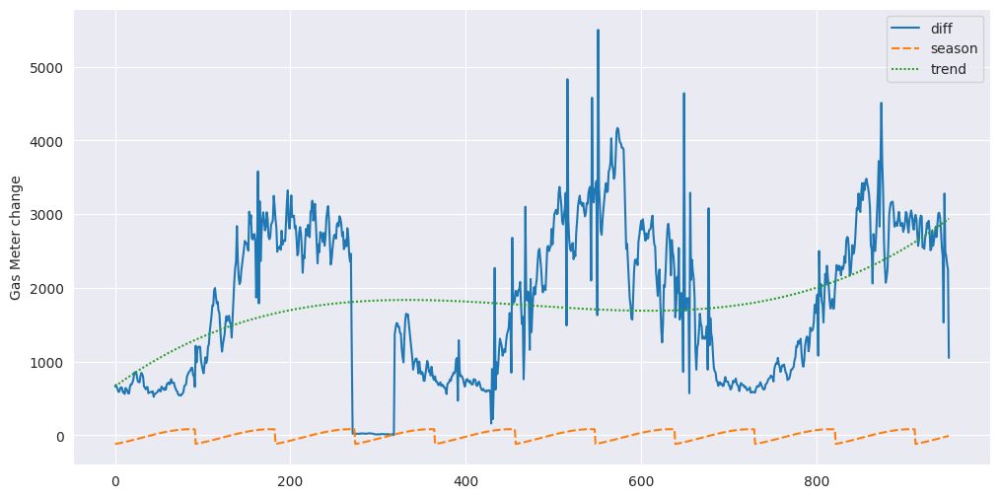

In [63]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12,6))
test_df = df.filter(pl.col("new_id") == "400204GVA").to_pandas()
test_df['date'] = pd.to_datetime(test_df['date'])
test_df['trend'] = get_trend(test_df["diff"])
test_df['season'] = get_season(test_df["diff"] - test_df["trend"])

sns.lineplot(data=test_df[["diff", "season", "trend"]])
plt.ylabel("Gas Meter change")

# Clustering